In [1]:
import numpy as np
import scipy as sp
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams, colors
from tqdm import tqdm
import emcee
import corner
import plotly.express as px
import plotly.graph_objects as go
import re
import glob

%matplotlib inline
# figure size in inches
rcParams['figure.figsize'] = 12,8
rcParams['axes.formatter.useoffset'] = False

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

### Re-running analysis for all planets

- Incorporate all data sources and re-run analysis for all planets
- Re-do the theory vs observation plots with the increased number of observations
- Plot also the various significance of decay lines
- Investigate how observed decay rates are distributed with respect to planetary and stellar parameters

In [2]:
def standardise_planet_name(name):
    return re.sub("([-_\s]|0(?=\d+?)|[AaBb]$)", "", name).lower()

In [3]:
def load_data(path):
    metadata = []
    with open(path) as f:
        header = 0
        while True:
            line = next(f)
            if line.startswith("#"):
                metadata.append(line)
                header += 1
            else:
                break
                
    column_name_map = {k: v for k, v in re.findall("COLUMN\s+(\w+):\s+([^,]+)", "".join(metadata))}
    df = pd.read_csv(path, skiprows=header, low_memory=False)
    df = df.rename(columns=column_name_map)

    return df

metadata = load_data("./data/NASA/planetary_systems_composite.csv").loc[:, ["Planet Name", "Orbital Period [days]"]]
metadata = metadata.rename(columns={"Planet Name": "planet", "Orbital Period [days]": "period"})
metadata.planet = metadata.planet.map(standardise_planet_name)
metadata = metadata.set_index("planet")
metadata.head()

,period
planet,
11com,326.030000
11umi,516.219970
14and,185.840000
14her,1765.038901
16cygb,798.500000


In [6]:
set(load_data("./data/NASA/planetary_systems_composite.csv").columns)

{'Argument of Periastron Limit Flag',
 'Argument of Periastron Lower Unc. [deg]',
 'Argument of Periastron Reference',
 'Argument of Periastron Upper Unc. [deg]',
 'Argument of Periastron [deg]',
 'B (Johnson) Magnitude',
 'B (Johnson) Magnitude Lower Unc',
 'B (Johnson) Magnitude Reference',
 'B (Johnson) Magnitude Upper Unc',
 'Circumbinary Flag',
 'Controversial Flag',
 'Data show Transit Timing Variations',
 'Dec [deg]',
 'Dec [sexagesimal]',
 'Detected by Astrometric Variations',
 'Detected by Disk Kinematics',
 'Detected by Eclipse Timing Variations',
 'Detected by Imaging',
 'Detected by Microlensing',
 'Detected by Orbital Brightness Modulations',
 'Detected by Pulsar Timing Variations',
 'Detected by Pulsation Timing Variations',
 'Detected by Radial Velocity Variations',
 'Detected by Transits',
 'Discovery Facility',
 'Discovery Instrument',
 'Discovery Locale',
 'Discovery Method',
 'Discovery Publication Date',
 'Discovery Reference',
 'Discovery Telescope',
 'Discovery Ye

In [4]:
files = glob.glob("./data/ETD/ORIGINALS/*.txt")

dfs = []

for file in tqdm(files):
    etd_data = pd.read_csv(file, sep="\t", names=["index", "epoch", "transit_time", "error", "data_quality", "observer"]).loc[:, ["transit_time", "error"]].sort_values("transit_time")
    etd_data["source"] = "ETD"
    etd_data["planet"] = standardise_planet_name(re.search("ETD_(.*)_og.txt", file).group(1))
    dfs.append(etd_data)

etd_data = pd.concat(dfs)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 71/71 [00:00<00:00, 166.04it/s]


In [5]:
etd_data.head()

,transit_time,error,source,planet
0,2.453980e+06,0.00069,ETD,hatp1
1,2.453984e+06,0.00900,ETD,hatp1
2,2.453989e+06,0.00076,ETD,hatp1
3,2.453998e+06,0.00054,ETD,hatp1
4,2.453998e+06,0.00047,ETD,hatp1


In [6]:
exoclock_data = pd.read_csv("./data/ExoClock/all_mid_time_data.txt", sep="\s+").sort_values("transit_time")
exoclock_data = exoclock_data.reset_index(drop=True).drop(columns=["ID"])  # includes TESS 2019
exoclock_data.source = exoclock_data.source.map({"literature": "ExoClock_Literature", "exoclock": "ExoClock_Original", "space": "ExoClock_TESS"})
exoclock_data.planet = exoclock_data.planet.map(standardise_planet_name)
exoclock_data.head()

,planet,transit_time,error,source
0,hd29458,2.452206e+06,0.00160,NaN
1,wasp153,2.453143e+06,0.00300,ExoClock_Literature
2,tres1,2.453187e+06,0.00020,ExoClock_Literature
3,hd29458,2.453200e+06,0.00120,NaN
4,hd29458,2.453235e+06,0.00068,ExoClock_Literature


In [7]:
en_masse_data = pd.read_csv("./data/Transit-Timing-En-Masse/table.csv")
en_masse_data = en_masse_data.loc[:, ["planet", "transit_time", "error"]]
en_masse_data["source"] = "Transit_Timing_En_Masse"
en_masse_data.planet = en_masse_data.planet.map(standardise_planet_name)
en_masse_data.head()

,planet,transit_time,error,source
0,corot1,2.454138e+06,0.00047,Transit_Timing_En_Masse
1,corot1,2.454140e+06,0.00059,Transit_Timing_En_Masse
2,corot1,2.454141e+06,0.00062,Transit_Timing_En_Masse
3,corot1,2.454143e+06,0.00039,Transit_Timing_En_Masse
4,corot1,2.454144e+06,0.00163,Transit_Timing_En_Masse


In [10]:
transit_df = pd.concat([exoclock_data, etd_data, en_masse_data]).sort_values("transit_time").drop_duplicates(["transit_time"]).reset_index(drop=True)

errors = set()

dfs = []
for planet, planet_df in tqdm(transit_df.groupby("planet")):
    try:
        period = metadata.loc[planet].period
        planet_df["epoch"] = ((planet_df.transit_time - planet_df.transit_time.iloc[0]) / period).round()
        planet_df = planet_df.drop_duplicates(["epoch"]).reset_index(drop=True)
        dfs.append(planet_df)
    except Exception:
        errors.add(planet)
    
transit_df = pd.concat(dfs)
transit_df.head()

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 535/535 [00:00<00:00, 655.22it/s]


,planet,transit_time,error,source,epoch
0,55cnce,2.455607e+06,0.00087,ExoClock_Literature,0.0
1,55cnce,2.458871e+06,0.00230,ExoClock_TESS,4432.0
2,55cnce,2.458872e+06,0.00078,ExoClock_TESS,4433.0
3,55cnce,2.458873e+06,0.00130,ExoClock_TESS,4434.0
4,55cnce,2.458874e+06,0.00100,ExoClock_TESS,4435.0


In [11]:
from code.outlier_detection import non_parametric
from code.fitting import analytical

def fit_with_outlier_removal(df):
    # survivors, outliers = non_parametric.non_parametric_without_error(df, threshold=0.1)
    beta, t_sigma, posterior_errors, k, t_dof, prob_decay = analytical.bayesian_mvn_regression_fit(df, K0=np.diag([1e-12, 1e-12, 1e-12]))
    mu = beta[2].item() * (24 * 60 * 60 * 1000)  # ms/epoch
    sd = np.sqrt(t_sigma[2, 2] * (t_dof / (t_dof - 2)) * (24 * 60 * 60 * 1000) ** 2)
    return mu, sd, prob_decay

In [12]:
# running for all planets
results = []

for planet, planet_df in tqdm(transit_df.groupby("planet")):
    if len(planet_df) < 4:
        print("Not enough data for", planet)
        continue
    mu, sd, prob_decay = fit_with_outlier_removal(planet_df)
    results.append({"planet": planet, "num_transits": len(planet_df), "mu": mu, "sd": sd, "prob_decay": prob_decay})

results = pd.DataFrame(data=results)

  5%|████████▎                                                                                                                                                                              | 22/484 [00:00<00:04, 104.29it/s]

E[dP/dE] = -0.004524422436697955 ms/epoch SD[dP/dE] = 0.01591070004727352 Prob(dP/dE < 0) = 0.6129620530463895
E[dP/dE] = 0.032469892374787646 ms/epoch SD[dP/dE] = 0.021328514509481634 Prob(dP/dE < 0) = 0.0636028561655747
Not enough data for corot10
E[dP/dE] = -1.6113429438730493 ms/epoch SD[dP/dE] = 0.4837649399107736 Prob(dP/dE < 0) = 0.9989718330760652
Not enough data for corot14
E[dP/dE] = 2.3033529004100886 ms/epoch SD[dP/dE] = 4.084793137065799 Prob(dP/dE < 0) = 0.2790613596029976
E[dP/dE] = -0.09900039188427504 ms/epoch SD[dP/dE] = 0.013702391786733563 Prob(dP/dE < 0) = 0.9999999999904048
E[dP/dE] = -1.5256479343846172 ms/epoch SD[dP/dE] = 4.168173415458157 Prob(dP/dE < 0) = 0.6461563149201808
E[dP/dE] = 11.89202346835093 ms/epoch SD[dP/dE] = 6.734223977202474 Prob(dP/dE < 0) = 0.03751540352574305
Not enough data for corot9
E[dP/dE] = 3.3296670380844615 ms/epoch SD[dP/dE] = 75.83034408238362 Prob(dP/dE < 0) = 0.48040293886061064
E[dP/dE] = 6.291212415015327 ms/epoch SD[dP/dE] = 

  7%|████████████▌                                                                                                                                                                           | 33/484 [00:00<00:05, 79.50it/s]

E[dP/dE] = -0.3488504461298511 ms/epoch SD[dP/dE] = 0.0795542043963815 Prob(dP/dE < 0) = 0.9999912264804132
E[dP/dE] = -0.04837640688033098 ms/epoch SD[dP/dE] = 0.040862456513157244 Prob(dP/dE < 0) = 0.8825591327296907
E[dP/dE] = 0.1933043805022748 ms/epoch SD[dP/dE] = 0.18467438791641533 Prob(dP/dE < 0) = 0.14578037343545142
E[dP/dE] = 0.4933532494528276 ms/epoch SD[dP/dE] = 0.4640174288349767 Prob(dP/dE < 0) = 0.1391014830279203
E[dP/dE] = -9.42478121145508 ms/epoch SD[dP/dE] = 8.359297848268687 Prob(dP/dE < 0) = 0.8854046731903671
E[dP/dE] = 0.03129323999925472 ms/epoch SD[dP/dE] = 0.09345531916420406 Prob(dP/dE < 0) = 0.36759252190366754
E[dP/dE] = 0.0685903557950265 ms/epoch SD[dP/dE] = 1.0010517810398751 Prob(dP/dE < 0) = 0.47087834807496254
E[dP/dE] = -1.1150785383040547 ms/epoch SD[dP/dE] = 0.34484595039267113 Prob(dP/dE < 0) = 0.9990193272824077
E[dP/dE] = -0.1167235012643429 ms/epoch SD[dP/dE] = 0.1363199931308461 Prob(dP/dE < 0) = 0.8058189840258245
E[dP/dE] = -0.62870650765

 11%|███████████████████▊                                                                                                                                                                    | 52/484 [00:00<00:06, 70.88it/s]

E[dP/dE] = -0.026801690466955304 ms/epoch SD[dP/dE] = 0.06505810534434665 Prob(dP/dE < 0) = 0.6606495936862331
E[dP/dE] = -0.011900662855156873 ms/epoch SD[dP/dE] = 0.1315362810719276 Prob(dP/dE < 0) = 0.5365141168193734
E[dP/dE] = -0.9432491140150548 ms/epoch SD[dP/dE] = 2.251029678393348 Prob(dP/dE < 0) = 0.6686135645678994
E[dP/dE] = -0.03385746083491792 ms/epoch SD[dP/dE] = 0.012906997468358177 Prob(dP/dE < 0) = 0.995421392020973
E[dP/dE] = 0.20363646768808039 ms/epoch SD[dP/dE] = 0.11131438377803472 Prob(dP/dE < 0) = 0.03393506306255366
E[dP/dE] = 10.721390086121765 ms/epoch SD[dP/dE] = 1.3908328134092838 Prob(dP/dE < 0) = 4.577882714280271e-08
E[dP/dE] = 0.10302565840437337 ms/epoch SD[dP/dE] = 0.9228673976234503 Prob(dP/dE < 0) = 0.4532440707226603
E[dP/dE] = 0.0546058750216525 ms/epoch SD[dP/dE] = 0.01715954031337588 Prob(dP/dE < 0) = 0.0008120302792855535
E[dP/dE] = 0.020102102382659626 ms/epoch SD[dP/dE] = 0.10636855057530072 Prob(dP/dE < 0) = 0.42442357068895037
E[dP/dE] = -

 17%|███████████████████████████████                                                                                                                                                        | 82/484 [00:00<00:03, 107.65it/s]

E[dP/dE] = 0.2287449973434818 ms/epoch SD[dP/dE] = 0.2559355902204281 Prob(dP/dE < 0) = 0.18278125891230784
E[dP/dE] = 0.7471142680507714 ms/epoch SD[dP/dE] = 0.5669754937963081 Prob(dP/dE < 0) = 0.091660998865781
E[dP/dE] = 0.8586638216448189 ms/epoch SD[dP/dE] = 0.6708336439203436 Prob(dP/dE < 0) = 0.09310061703435744
E[dP/dE] = 1.0564948979652748 ms/epoch SD[dP/dE] = 3.7119598392554005 Prob(dP/dE < 0) = 0.36965306205162585
E[dP/dE] = 0.29066814874993757 ms/epoch SD[dP/dE] = 0.4345804306991413 Prob(dP/dE < 0) = 0.24446165507330953
E[dP/dE] = -0.029491340569591167 ms/epoch SD[dP/dE] = 0.06026303002470023 Prob(dP/dE < 0) = 0.6892363071831411
E[dP/dE] = 0.17210503102643154 ms/epoch SD[dP/dE] = 0.626164580506665 Prob(dP/dE < 0) = 0.38932668514307245
E[dP/dE] = -1.8427978119443411 ms/epoch SD[dP/dE] = 0.901545386425862 Prob(dP/dE < 0) = 0.9774450599772533
E[dP/dE] = 0.3336410827611263 ms/epoch SD[dP/dE] = 0.2739138354528266 Prob(dP/dE < 0) = 0.10883743231186475
E[dP/dE] = -0.2230544261292

 19%|███████████████████████████████████▋                                                                                                                                                    | 94/484 [00:01<00:08, 48.08it/s]

E[dP/dE] = 0.1099734191710732 ms/epoch SD[dP/dE] = 0.015471178914212104 Prob(dP/dE < 0) = 1.6020974570934318e-12
E[dP/dE] = -5.6934068211887645 ms/epoch SD[dP/dE] = 47.15684674565049 Prob(dP/dE < 0) = 0.5505443689690895
E[dP/dE] = -0.3907739412052891 ms/epoch SD[dP/dE] = 0.17271044150921175 Prob(dP/dE < 0) = 0.9871551108171728
E[dP/dE] = 0.16401831572904454 ms/epoch SD[dP/dE] = 0.3177480929596984 Prob(dP/dE < 0) = 0.2965324449090896
E[dP/dE] = 0.03742266017066763 ms/epoch SD[dP/dE] = 0.4270712407954487 Prob(dP/dE < 0) = 0.46338375644378493
Not enough data for hats10
E[dP/dE] = -0.3675390615850082 ms/epoch SD[dP/dE] = 2.4503165140665186 Prob(dP/dE < 0) = 0.5666022923337092
Not enough data for hats12
E[dP/dE] = 0.7504495968639047 ms/epoch SD[dP/dE] = 0.8230337727658388 Prob(dP/dE < 0) = 0.17314999169595202
E[dP/dE] = 1.7884397067273614 ms/epoch SD[dP/dE] = 1.207397045829568 Prob(dP/dE < 0) = 0.06678712101081725
Not enough data for hats15
E[dP/dE] = -1.3335899041053687 ms/epoch SD[dP/dE] 

 25%|████████████████████████████████████████████▉                                                                                                                                          | 119/484 [00:01<00:05, 69.71it/s]

E[dP/dE] = 0.025782428991734965 ms/epoch SD[dP/dE] = 0.08060349272002156 Prob(dP/dE < 0) = 0.37246099854834747
E[dP/dE] = 0.0845516041180481 ms/epoch SD[dP/dE] = 2.6308547657460037 Prob(dP/dE < 0) = 0.48624720175525293
E[dP/dE] = 1.388830081337776 ms/epoch SD[dP/dE] = 2.5469105541014287 Prob(dP/dE < 0) = 0.28552734516229716
E[dP/dE] = 0.4268700592997726 ms/epoch SD[dP/dE] = 7.184869333287739 Prob(dP/dE < 0) = 0.47458979997831435
E[dP/dE] = -124.89348118252808 ms/epoch SD[dP/dE] = 162.97585457869843 Prob(dP/dE < 0) = 0.7962720132503321
E[dP/dE] = 1.285154408491132 ms/epoch SD[dP/dE] = 9.998293812793502 Prob(dP/dE < 0) = 0.4400368430245266
E[dP/dE] = 1.1444929100423373 ms/epoch SD[dP/dE] = 0.9308680318178023 Prob(dP/dE < 0) = 0.09963476950885727
E[dP/dE] = 0.3931923203022667 ms/epoch SD[dP/dE] = 0.6471411583232944 Prob(dP/dE < 0) = 0.2670843296257813
E[dP/dE] = 48.87346042745208 ms/epoch SD[dP/dE] = 40.20684586611145 Prob(dP/dE < 0) = 0.08868901681904653
E[dP/dE] = 0.877964926359286 ms/e

 32%|███████████████████████████████████████████████████████████                                                                                                                           | 157/484 [00:01<00:02, 112.89it/s]

E[dP/dE] = -99.19591750237116 ms/epoch SD[dP/dE] = 288.5972483708093 Prob(dP/dE < 0) = 0.6518093100560414
E[dP/dE] = -172.48462181083627 ms/epoch SD[dP/dE] = 557.3969643349318 Prob(dP/dE < 0) = 0.6411288433255562
E[dP/dE] = 0.017712653743711164 ms/epoch SD[dP/dE] = 0.6270876908404955 Prob(dP/dE < 0) = 0.4883541420244973
E[dP/dE] = -0.2862658845967282 ms/epoch SD[dP/dE] = 9.291384658398494 Prob(dP/dE < 0) = 0.5129824216353914
Not enough data for hats61
Not enough data for hats62
E[dP/dE] = -27.069163448318463 ms/epoch SD[dP/dE] = 70.00493542535916 Prob(dP/dE < 0) = 0.6575896978326126
E[dP/dE] = 704.7820937280903 ms/epoch SD[dP/dE] = 609.8455655204623 Prob(dP/dE < 0) = 0.1033491929250286
E[dP/dE] = 5.098554167654487 ms/epoch SD[dP/dE] = 41.98518839239225 Prob(dP/dE < 0) = 0.44597487535746083
E[dP/dE] = -10.827450315520622 ms/epoch SD[dP/dE] = 5.300776517787701 Prob(dP/dE < 0) = 0.9780316771080688
E[dP/dE] = 5.676637054813234 ms/epoch SD[dP/dE] = 3.5914557744116293 Prob(dP/dE < 0) = 0.055

 39%|██████████████████████████████████████████████████████████████████████▋                                                                                                               | 188/484 [00:02<00:02, 119.07it/s]

E[dP/dE] = 453.9803341567684 ms/epoch SD[dP/dE] = 343.5672449483122 Prob(dP/dE < 0) = 0.08724598697744795
E[dP/dE] = -301.4450104953253 ms/epoch SD[dP/dE] = 7283.000806564842 Prob(dP/dE < 0) = 0.5202725354803035
E[dP/dE] = 801.4989650781047 ms/epoch SD[dP/dE] = 559.8981475463402 Prob(dP/dE < 0) = 0.07091040039991202
E[dP/dE] = -3675.6015208843182 ms/epoch SD[dP/dE] = 1167.688476246434 Prob(dP/dE < 0) = 0.9972275520548404
E[dP/dE] = 0.2880887336684129 ms/epoch SD[dP/dE] = 5.395682591252407 Prob(dP/dE < 0) = 0.4779242439720347
E[dP/dE] = -0.23634495001066633 ms/epoch SD[dP/dE] = 0.2133597004000428 Prob(dP/dE < 0) = 0.86741048502456
E[dP/dE] = 84.67012859787874 ms/epoch SD[dP/dE] = 76.89584196645896 Prob(dP/dE < 0) = 0.125492519772424
E[dP/dE] = 81.30420394528356 ms/epoch SD[dP/dE] = 94.68862320874494 Prob(dP/dE < 0) = 0.17784360639627955
E[dP/dE] = 17.55653133271216 ms/epoch SD[dP/dE] = 266.2002639182136 Prob(dP/dE < 0) = 0.4699916612054499
E[dP/dE] = -0.8517715428970981 ms/epoch SD[dP/d

 42%|███████████████████████████████████████████████████████████████████████████▉                                                                                                          | 202/484 [00:02<00:02, 111.98it/s]

E[dP/dE] = 833.4147682367834 ms/epoch SD[dP/dE] = 3303.5774012327647 Prob(dP/dE < 0) = 0.38699479144399235
E[dP/dE] = 4.930921539875797 ms/epoch SD[dP/dE] = 174.1481644866016 Prob(dP/dE < 0) = 0.4878829462978017
E[dP/dE] = -25.4539090604767 ms/epoch SD[dP/dE] = 24.167291611349096 Prob(dP/dE < 0) = 0.8621659352388537
E[dP/dE] = -2.9136687686530385 ms/epoch SD[dP/dE] = 1.5189629565917906 Prob(dP/dE < 0) = 0.9718701419871187
E[dP/dE] = 0.15297085198524818 ms/epoch SD[dP/dE] = 0.19015873257097596 Prob(dP/dE < 0) = 0.19479466187750588
E[dP/dE] = -4946.5826691524035 ms/epoch SD[dP/dE] = 2899.150580212674 Prob(dP/dE < 0) = 0.9591828938399743
E[dP/dE] = 81.87270824172171 ms/epoch SD[dP/dE] = 68.9641184877893 Prob(dP/dE < 0) = 0.11028219833007988
E[dP/dE] = 0.18502297933746065 ms/epoch SD[dP/dE] = 0.23248755725598788 Prob(dP/dE < 0) = 0.20969527028413282
E[dP/dE] = -8.436966952265923 ms/epoch SD[dP/dE] = 12.04672183940972 Prob(dP/dE < 0) = 0.7659472467316306
E[dP/dE] = 0.040656099287121196 ms/e

 44%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                                     | 215/484 [00:02<00:03, 87.12it/s]

E[dP/dE] = -1.9935036661402663 ms/epoch SD[dP/dE] = 5.77695730239568 Prob(dP/dE < 0) = 0.6379601564434054
E[dP/dE] = 0.023685709393793292 ms/epoch SD[dP/dE] = 0.028897909622578977 Prob(dP/dE < 0) = 0.20503632991810655
E[dP/dE] = 0.459141716646168 ms/epoch SD[dP/dE] = 2.098497153473425 Prob(dP/dE < 0) = 0.4110153800334013
E[dP/dE] = 2.009425125491171 ms/epoch SD[dP/dE] = 1.3820198944109494 Prob(dP/dE < 0) = 0.07174035578844658
E[dP/dE] = 22.469313552142278 ms/epoch SD[dP/dE] = 10.293965225487101 Prob(dP/dE < 0) = 0.017412382888323454
E[dP/dE] = 0.11212651287439868 ms/epoch SD[dP/dE] = 0.3233316629492859 Prob(dP/dE < 0) = 0.3611834350280472
E[dP/dE] = 1.7050003521018198 ms/epoch SD[dP/dE] = 0.9255219572868779 Prob(dP/dE < 0) = 0.03313825643623988
E[dP/dE] = -0.603374438412026 ms/epoch SD[dP/dE] = 0.6364684195136227 Prob(dP/dE < 0) = 0.8307954353561314
E[dP/dE] = 0.30379214024348217 ms/epoch SD[dP/dE] = 3.7805358531720565 Prob(dP/dE < 0) = 0.46699240409029197
E[dP/dE] = 1.0518990222852547

 47%|█████████████████████████████████████████████████████████████████████████████████████▍                                                                                                 | 226/484 [00:02<00:03, 77.81it/s]

E[dP/dE] = -3.4779176019093714 ms/epoch SD[dP/dE] = 7.940395209775677 Prob(dP/dE < 0) = 0.6800048222043744
E[dP/dE] = -0.12086420184674998 ms/epoch SD[dP/dE] = 0.10133719016572358 Prob(dP/dE < 0) = 0.885611538496541
E[dP/dE] = -1.2050234090553886 ms/epoch SD[dP/dE] = 2.4745614307250525 Prob(dP/dE < 0) = 0.6982662949625336
E[dP/dE] = -0.05417462318740984 ms/epoch SD[dP/dE] = 0.033980034621191736 Prob(dP/dE < 0) = 0.9451609383735461
E[dP/dE] = 26.09123822591874 ms/epoch SD[dP/dE] = 26.2190654383765 Prob(dP/dE < 0) = 0.1581434494844411
E[dP/dE] = -8333.262793431311 ms/epoch SD[dP/dE] = 998.4149259562145 Prob(dP/dE < 0) = 0.9999998340053331
E[dP/dE] = -1.1334601225587482 ms/epoch SD[dP/dE] = 1.1067551449132325 Prob(dP/dE < 0) = 0.8479449850019533
E[dP/dE] = 0.16020628663666125 ms/epoch SD[dP/dE] = 6.745418457227158 Prob(dP/dE < 0) = 0.4904721665315914
E[dP/dE] = -0.060330901874234455 ms/epoch SD[dP/dE] = 1.1918102858268471 Prob(dP/dE < 0) = 0.5203162905811025
E[dP/dE] = 0.6643472588046002 

 49%|████████████████████████████████████████████████████████████████████████████████████████▊                                                                                              | 235/484 [00:03<00:06, 38.93it/s]

E[dP/dE] = 0.013362571849015972 ms/epoch SD[dP/dE] = 0.3786995456812229 Prob(dP/dE < 0) = 0.4858806727266898
E[dP/dE] = 15.58636882917459 ms/epoch SD[dP/dE] = 11.408974604806634 Prob(dP/dE < 0) = 0.08503214321865858


 54%|███████████████████████████████████████████████████████████████████████████████████████████████████                                                                                    | 262/484 [00:04<00:05, 39.40it/s]

E[dP/dE] = 0.008618552271846531 ms/epoch SD[dP/dE] = 0.007073438582767845 Prob(dP/dE < 0) = 0.11139635318095002
E[dP/dE] = -82.22759295213982 ms/epoch SD[dP/dE] = 53.80123779274362 Prob(dP/dE < 0) = 0.9374959940852969
E[dP/dE] = 13.333706465332705 ms/epoch SD[dP/dE] = 54.379731379159125 Prob(dP/dE < 0) = 0.39988189742572205
E[dP/dE] = 8749.399321291437 ms/epoch SD[dP/dE] = 1647.0664961678829 Prob(dP/dE < 0) = 9.839282862452296e-05
E[dP/dE] = 0.2307816593824975 ms/epoch SD[dP/dE] = 0.2905781087762757 Prob(dP/dE < 0) = 0.21141712125097056
E[dP/dE] = 4.872282033824961 ms/epoch SD[dP/dE] = 6.196721528979017 Prob(dP/dE < 0) = 0.2088744660858915
E[dP/dE] = -16.094449446752424 ms/epoch SD[dP/dE] = 6.684018294265602 Prob(dP/dE < 0) = 0.9914897326818449
E[dP/dE] = 25.886877921240316 ms/epoch SD[dP/dE] = 36.51843885478641 Prob(dP/dE < 0) = 0.23564293610867754
E[dP/dE] = 160.2242993383914 ms/epoch SD[dP/dE] = 422.19417373843027 Prob(dP/dE < 0) = 0.32245862306499185
E[dP/dE] = 19.87882251766281 ms

 56%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                | 272/484 [00:04<00:06, 35.18it/s]

E[dP/dE] = 0.029536827383906276 ms/epoch SD[dP/dE] = 0.008547897843117404 Prob(dP/dE < 0) = 0.00029570251730305907
E[dP/dE] = 0.7263589282039914 ms/epoch SD[dP/dE] = 0.389914556138715 Prob(dP/dE < 0) = 0.031333292130614164
E[dP/dE] = -0.07248520503814715 ms/epoch SD[dP/dE] = 0.008516442010106607 Prob(dP/dE < 0) = 0.9999999999999253
E[dP/dE] = 2.051377052223638 ms/epoch SD[dP/dE] = 1.5153554557771558 Prob(dP/dE < 0) = 0.08054718449791795
E[dP/dE] = 0.07073404901795785 ms/epoch SD[dP/dE] = 0.18547508214879446 Prob(dP/dE < 0) = 0.34992152362826295
E[dP/dE] = -1.5146171804743376 ms/epoch SD[dP/dE] = 1.142616424243731 Prob(dP/dE < 0) = 0.9116208170268775
E[dP/dE] = -41.2601679797873 ms/epoch SD[dP/dE] = 501.25207622208075 Prob(dP/dE < 0) = 0.5374288167281469
E[dP/dE] = -12.396561946546962 ms/epoch SD[dP/dE] = 6.838255401560611 Prob(dP/dE < 0) = 0.9650088210046114
E[dP/dE] = 2.2936804583627945 ms/epoch SD[dP/dE] = 4.309521578270555 Prob(dP/dE < 0) = 0.2930346358241691
E[dP/dE] = -0.496454928

 59%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                          | 287/484 [00:04<00:04, 41.95it/s]

E[dP/dE] = 2.294918328968812 ms/epoch SD[dP/dE] = 2.8253530027543667 Prob(dP/dE < 0) = 0.20568263740362291
E[dP/dE] = 13460.175430962136 ms/epoch SD[dP/dE] = 4665.743404862891 Prob(dP/dE < 0) = 0.0048323756380071695
Not enough data for toi1266c
E[dP/dE] = -40.46225324710168 ms/epoch SD[dP/dE] = 77.20498684235102 Prob(dP/dE < 0) = 0.7049664396335538
E[dP/dE] = -3.9029662701711536 ms/epoch SD[dP/dE] = 143.23211263572105 Prob(dP/dE < 0) = 0.5111794402360971
Not enough data for toi1478
E[dP/dE] = 4.53105134851741 ms/epoch SD[dP/dE] = 28.518635353709797 Prob(dP/dE < 0) = 0.4359743756247112
E[dP/dE] = -596.2982389584402 ms/epoch SD[dP/dE] = 1014.646831382892 Prob(dP/dE < 0) = 0.7588793962940892
E[dP/dE] = 1.2318646199093068 ms/epoch SD[dP/dE] = 1.5483466807896973 Prob(dP/dE < 0) = 0.21224148059734277
E[dP/dE] = 7.981661360637393 ms/epoch SD[dP/dE] = 8.58678426219773 Prob(dP/dE < 0) = 0.17465357256755704
E[dP/dE] = 5.432242252817583 ms/epoch SD[dP/dE] = 10.025343180420956 Prob(dP/dE < 0) = 0.

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                 | 310/484 [00:05<00:02, 64.16it/s]

E[dP/dE] = -13.048032926108728 ms/epoch SD[dP/dE] = 27.699208793386138 Prob(dP/dE < 0) = 0.6866507663238899
E[dP/dE] = 105.40031371835686 ms/epoch SD[dP/dE] = 107.64644308128102 Prob(dP/dE < 0) = 0.14965576240818065
E[dP/dE] = 73.45865762708328 ms/epoch SD[dP/dE] = 82.83530066868043 Prob(dP/dE < 0) = 0.18012862511643374
E[dP/dE] = -502.3111432587463 ms/epoch SD[dP/dE] = 708.960618328189 Prob(dP/dE < 0) = 0.7766703661309474
Not enough data for toi276
E[dP/dE] = -3572.998524654005 ms/epoch SD[dP/dE] = 2254.0464691875018 Prob(dP/dE < 0) = 0.9485837265752162
E[dP/dE] = -2.3473117433757524 ms/epoch SD[dP/dE] = 2.5307325431231558 Prob(dP/dE < 0) = 0.8296993918043862
E[dP/dE] = -1552.2946802248437 ms/epoch SD[dP/dE] = 3444.131952824871 Prob(dP/dE < 0) = 0.707046397647797
E[dP/dE] = -1905.2036587576413 ms/epoch SD[dP/dE] = 12043.017421279754 Prob(dP/dE < 0) = 0.5702006933899907
E[dP/dE] = -1437.6582202075215 ms/epoch SD[dP/dE] = 14090.958977073315 Prob(dP/dE < 0) = 0.5476804606726886
E[dP/dE] 

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                             | 321/484 [00:05<00:02, 69.66it/s]

E[dP/dE] = 0.011190370230440472 ms/epoch SD[dP/dE] = 0.02496954440081533 Prob(dP/dE < 0) = 0.32612348916945644
E[dP/dE] = -0.051482440710463734 ms/epoch SD[dP/dE] = 0.009015096666323103 Prob(dP/dE < 0) = 0.9999999911770249


 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                          | 330/484 [00:05<00:05, 28.83it/s]

E[dP/dE] = 0.013707435186902265 ms/epoch SD[dP/dE] = 0.0031966224585636793 Prob(dP/dE < 0) = 1.0491865545838907e-05
E[dP/dE] = 1.16698810614818 ms/epoch SD[dP/dE] = 0.278545945670072 Prob(dP/dE < 0) = 4.446263666171656e-05
E[dP/dE] = 0.010266341377008496 ms/epoch SD[dP/dE] = 0.012314547138185718 Prob(dP/dE < 0) = 0.20159217000767216
E[dP/dE] = -0.010361478075527526 ms/epoch SD[dP/dE] = 0.07240182652328163 Prob(dP/dE < 0) = 0.5575966453696309
E[dP/dE] = -23.60921001096498 ms/epoch SD[dP/dE] = 71.01467524726712 Prob(dP/dE < 0) = 0.6444678309455523
E[dP/dE] = -7.318808394522377 ms/epoch SD[dP/dE] = 5.2655012639473 Prob(dP/dE < 0) = 0.9213794765541885
E[dP/dE] = 0.14759661652859696 ms/epoch SD[dP/dE] = 0.21376696069709417 Prob(dP/dE < 0) = 0.23616530274729686
E[dP/dE] = 1.8206210427233582 ms/epoch SD[dP/dE] = 7.884400569849316 Prob(dP/dE < 0) = 0.40229252431797546
E[dP/dE] = 1.2641169774939134 ms/epoch SD[dP/dE] = 1.6754789957801417 Prob(dP/dE < 0) = 0.21647142973517863
E[dP/dE] = -0.37318

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 343/484 [00:06<00:04, 29.48it/s]

E[dP/dE] = -0.07948787228421006 ms/epoch SD[dP/dE] = 0.0035860205234798694 Prob(dP/dE < 0) = 1.0
E[dP/dE] = 1.0211390772941533 ms/epoch SD[dP/dE] = 1.1327795018079978 Prob(dP/dE < 0) = 0.17790752013443706
E[dP/dE] = -0.0032533911564736834 ms/epoch SD[dP/dE] = 0.02068327337334372 Prob(dP/dE < 0) = 0.5632714404934397
E[dP/dE] = 0.13131707561329278 ms/epoch SD[dP/dE] = 0.6636554612443195 Prob(dP/dE < 0) = 0.418062323908478
E[dP/dE] = 0.4041075825962758 ms/epoch SD[dP/dE] = 0.846258625487176 Prob(dP/dE < 0) = 0.30619987009420824
E[dP/dE] = -0.4763252960055763 ms/epoch SD[dP/dE] = 0.473698913121069 Prob(dP/dE < 0) = 0.8435080463130186
E[dP/dE] = -0.22395543339803564 ms/epoch SD[dP/dE] = 0.417220333744905 Prob(dP/dE < 0) = 0.7104290859725098
E[dP/dE] = -1.3871803929518816 ms/epoch SD[dP/dE] = 3.576838683470517 Prob(dP/dE < 0) = 0.6631080148491388
E[dP/dE] = -6.56769850024173 ms/epoch SD[dP/dE] = 15.02050873512663 Prob(dP/dE < 0) = 0.6863766495703088
E[dP/dE] = 3.9966512275628747 ms/epoch SD[

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 359/484 [00:06<00:03, 41.51it/s]

E[dP/dE] = -1.4729648796659425 ms/epoch SD[dP/dE] = 4.544205850664652 Prob(dP/dE < 0) = 0.6391452783883687
E[dP/dE] = 4.969506061053867 ms/epoch SD[dP/dE] = 1.9775554302385532 Prob(dP/dE < 0) = 0.00824019611497691
E[dP/dE] = -2.4582857861308156 ms/epoch SD[dP/dE] = 3.528609020495146 Prob(dP/dE < 0) = 0.7663962579048411
E[dP/dE] = -0.009168346082324131 ms/epoch SD[dP/dE] = 0.11626307777822605 Prob(dP/dE < 0) = 0.532228708307279
E[dP/dE] = 1.0718278105048935 ms/epoch SD[dP/dE] = 1.2944732997734882 Prob(dP/dE < 0) = 0.19569576733173788
E[dP/dE] = -0.3770874172911002 ms/epoch SD[dP/dE] = 0.818353549205046 Prob(dP/dE < 0) = 0.6841339423782498
E[dP/dE] = 0.12517921419417902 ms/epoch SD[dP/dE] = 0.5573958010353628 Prob(dP/dE < 0) = 0.4074353821944489
E[dP/dE] = -1.903011399660188 ms/epoch SD[dP/dE] = 10.626346737952606 Prob(dP/dE < 0) = 0.5766659635972285
E[dP/dE] = 0.31446241450762885 ms/epoch SD[dP/dE] = 3.6681637921450996 Prob(dP/dE < 0) = 0.4633653242120084
E[dP/dE] = 8.297987909591825 ms

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 382/484 [00:06<00:01, 64.98it/s]

E[dP/dE] = 0.21419222875330385 ms/epoch SD[dP/dE] = 0.41989056778526934 Prob(dP/dE < 0) = 0.29797629542410353
E[dP/dE] = 6.361612152255025 ms/epoch SD[dP/dE] = 5.312299164994796 Prob(dP/dE < 0) = 0.1083909558563169
E[dP/dE] = -7.035657100111406 ms/epoch SD[dP/dE] = 6.218639974307886 Prob(dP/dE < 0) = 0.884205246564326
E[dP/dE] = 0.011241900210723214 ms/epoch SD[dP/dE] = 0.20495920121325775 Prob(dP/dE < 0) = 0.47728070123331817
E[dP/dE] = -2.7554723430939427 ms/epoch SD[dP/dE] = 8.081783702764785 Prob(dP/dE < 0) = 0.6387554448629863
E[dP/dE] = 11.642389222276687 ms/epoch SD[dP/dE] = 22.616809708342302 Prob(dP/dE < 0) = 0.28433404136593954
E[dP/dE] = -1.3331482733733846 ms/epoch SD[dP/dE] = 1.0635796713784782 Prob(dP/dE < 0) = 0.9013868772760264
E[dP/dE] = 14.92002989634429 ms/epoch SD[dP/dE] = 14.787016907551573 Prob(dP/dE < 0) = 0.14888138564694425
E[dP/dE] = 4.30024039416846 ms/epoch SD[dP/dE] = 4.299380852866679 Prob(dP/dE < 0) = 0.15092994830976458
E[dP/dE] = 0.0008080000668534117 m

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 405/484 [00:07<00:01, 78.46it/s]

E[dP/dE] = -0.005112240231136983 ms/epoch SD[dP/dE] = 0.0019347134973784824 Prob(dP/dE < 0) = 0.9956884660619192
E[dP/dE] = 1.42834613256894 ms/epoch SD[dP/dE] = 13.210939666179367 Prob(dP/dE < 0) = 0.45309018863981076
E[dP/dE] = -0.31176259653844424 ms/epoch SD[dP/dE] = 2.4240993631468237 Prob(dP/dE < 0) = 0.5542518409735335
E[dP/dE] = 0.04780589364367864 ms/epoch SD[dP/dE] = 0.02346113052994463 Prob(dP/dE < 0) = 0.02103770852852895
E[dP/dE] = -0.24304140140405503 ms/epoch SD[dP/dE] = 0.9342097215868095 Prob(dP/dE < 0) = 0.6081434272299631
E[dP/dE] = -1.5037977647110405 ms/epoch SD[dP/dE] = 0.43461285124036525 Prob(dP/dE < 0) = 0.9991240168578716
E[dP/dE] = -0.5159681194294832 ms/epoch SD[dP/dE] = 0.19972171269133046 Prob(dP/dE < 0) = 0.9932739707646603
E[dP/dE] = -0.04472614278934163 ms/epoch SD[dP/dE] = 0.1713517460914635 Prob(dP/dE < 0) = 0.6058726354112851
E[dP/dE] = -0.037180281253730865 ms/epoch SD[dP/dE] = 0.10101842325109411 Prob(dP/dE < 0) = 0.6471723062345965
E[dP/dE] = 0.26

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 415/484 [00:07<00:00, 77.88it/s]

E[dP/dE] = 0.11294842181530458 ms/epoch SD[dP/dE] = 0.17763082085464732 Prob(dP/dE < 0) = 0.2547668701159214
E[dP/dE] = 0.04074233430624663 ms/epoch SD[dP/dE] = 0.02043479258165024 Prob(dP/dE < 0) = 0.023405496890875337
E[dP/dE] = -0.8665451460379219 ms/epoch SD[dP/dE] = 0.6831042583623061 Prob(dP/dE < 0) = 0.901909254680551
E[dP/dE] = -3.8070748473690528 ms/epoch SD[dP/dE] = 3.7151222183439554 Prob(dP/dE < 0) = 0.8676752816201606
E[dP/dE] = -0.037722631418508644 ms/epoch SD[dP/dE] = 0.23547744945680868 Prob(dP/dE < 0) = 0.5661992629078139
E[dP/dE] = -0.027840347627233666 ms/epoch SD[dP/dE] = 0.00339078970464692 Prob(dP/dE < 0) = 0.9999999999999306
E[dP/dE] = -0.16922476220298807 ms/epoch SD[dP/dE] = 0.07328781678946811 Prob(dP/dE < 0) = 0.9884709952664641
E[dP/dE] = 0.7512882348229812 ms/epoch SD[dP/dE] = 0.370678707619843 Prob(dP/dE < 0) = 0.022594931705977348
E[dP/dE] = 0.004644019568895504 ms/epoch SD[dP/dE] = 0.0017254330045549302 Prob(dP/dE < 0) = 0.0036914792465404297
E[dP/dE] =

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 433/484 [00:07<00:00, 74.00it/s]

E[dP/dE] = 0.01317728646198294 ms/epoch SD[dP/dE] = 0.0593386786389377 Prob(dP/dE < 0) = 0.41162928027937584
E[dP/dE] = -0.1645313517427158 ms/epoch SD[dP/dE] = 0.18541663772538994 Prob(dP/dE < 0) = 0.8181303474831483
E[dP/dE] = 0.03326110586950874 ms/epoch SD[dP/dE] = 0.01861556697424171 Prob(dP/dE < 0) = 0.037079702350951885
E[dP/dE] = 0.0713375982285666 ms/epoch SD[dP/dE] = 0.04136900709750421 Prob(dP/dE < 0) = 0.04228459440538135
E[dP/dE] = -0.0538525895876235 ms/epoch SD[dP/dE] = 0.019190980780750804 Prob(dP/dE < 0) = 0.9972748224306028
E[dP/dE] = 0.6247453370627346 ms/epoch SD[dP/dE] = 0.3405682809408804 Prob(dP/dE < 0) = 0.033748552864167336
E[dP/dE] = -0.27817230119325737 ms/epoch SD[dP/dE] = 0.6523178148369775 Prob(dP/dE < 0) = 0.6756154071588446
E[dP/dE] = -0.03263424730445341 ms/epoch SD[dP/dE] = 0.26148695328416416 Prob(dP/dE < 0) = 0.5514756509222436
E[dP/dE] = -1.9008993803007885 ms/epoch SD[dP/dE] = 1.422282201716483 Prob(dP/dE < 0) = 0.9126932450182538
E[dP/dE] = -0.506

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 472/484 [00:07<00:00, 106.19it/s]

E[dP/dE] = 1.7271336872664513 ms/epoch SD[dP/dE] = 1.1481322444606423 Prob(dP/dE < 0) = 0.061125100914352304
Not enough data for wasp70a
E[dP/dE] = 0.18127506535829588 ms/epoch SD[dP/dE] = 0.40306954358921326 Prob(dP/dE < 0) = 0.31954490624613774
E[dP/dE] = 0.1731141054504493 ms/epoch SD[dP/dE] = 0.2918941246866079 Prob(dP/dE < 0) = 0.27332349215253016
E[dP/dE] = -1.0742775373262874 ms/epoch SD[dP/dE] = 2.078119928115207 Prob(dP/dE < 0) = 0.7091825090811612
E[dP/dE] = -0.0311698443055918 ms/epoch SD[dP/dE] = 0.23064832825002515 Prob(dP/dE < 0) = 0.5567429076207124
E[dP/dE] = -0.09795699611449189 ms/epoch SD[dP/dE] = 0.1482346707775511 Prob(dP/dE < 0) = 0.7507510708032888
E[dP/dE] = -0.049199984886123184 ms/epoch SD[dP/dE] = 0.06297135481506501 Prob(dP/dE < 0) = 0.7858339066009253
E[dP/dE] = -0.014854101948443409 ms/epoch SD[dP/dE] = 0.015561053979394123 Prob(dP/dE < 0) = 0.8330527795896332
E[dP/dE] = -0.06601285917888837 ms/epoch SD[dP/dE] = 0.345898910442592 Prob(dP/dE < 0) = 0.577565

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 484/484 [00:07<00:00, 60.80it/s]

E[dP/dE] = 0.21251385930988026 ms/epoch SD[dP/dE] = 0.2209504389544902 Prob(dP/dE < 0) = 0.16172178286687217
E[dP/dE] = -4.295963981344609 ms/epoch SD[dP/dE] = 2.752952118649399 Prob(dP/dE < 0) = 0.9434604710161613
Not enough data for wendelstein1
E[dP/dE] = 0.0926540892009126 ms/epoch SD[dP/dE] = 0.06585616626153033 Prob(dP/dE < 0) = 0.07917361136853576
E[dP/dE] = -0.1490982569406115 ms/epoch SD[dP/dE] = 0.07542063693149938 Prob(dP/dE < 0) = 0.9754560984519021
E[dP/dE] = 0.04035196496939137 ms/epoch SD[dP/dE] = 0.13738458769598486 Prob(dP/dE < 0) = 0.38319724189067966
E[dP/dE] = -0.30565873032598023 ms/epoch SD[dP/dE] = 0.7544559151086621 Prob(dP/dE < 0) = 0.6605698746680828
E[dP/dE] = 1.5618981052496406 ms/epoch SD[dP/dE] = 0.2448464782168023 Prob(dP/dE < 0) = 8.316457632585535e-09
E[dP/dE] = 1.0315422244378767 ms/epoch SD[dP/dE] = 0.4338358099859082 Prob(dP/dE < 0) = 0.009320952840902747
E[dP/dE] = -1.3767348477231156 ms/epoch SD[dP/dE] = 0.8890977732265066 Prob(dP/dE < 0) = 0.93994

In [13]:
results.head()

,planet,num_transits,mu,sd,prob_decay
0,55cnce,92,-0.004524,0.015911,0.612962
1,corot1,104,0.032470,0.021329,0.063603
2,corot11,22,-1.611343,0.483765,0.998972
3,corot19,19,2.303353,4.084793,0.279061
4,corot2,169,-0.099000,0.013702,1.000000


#### Combining with theory

In [14]:
theoretical_df = pd.read_csv("./results/3_theoretical_decay.csv", index_col=0)
theoretical_df = theoretical_df.rename(columns={"Planet Name": "planet"})
theoretical_df.planet = theoretical_df.planet.map(standardise_planet_name)
theoretical_df.head()

,rowid,planet,Host Name,Planet Letter,HD ID,HIP ID,TIC ID,GAIA ID,Number of Stars,Number of Planets,Number of Moons,Circumbinary Flag,Discovery Method,Discovery Year,Discovery Reference,Discovery Publication Date,Discovery Locale,Discovery Facility,Discovery Telescope,Discovery Instrument,Detected by Radial Velocity Variations,Detected by Pulsar Timing Variations,Detected by Pulsation Timing Variations,Detected by Transits,Detected by Astrometric Variations,Detected by Orbital Brightness Modulations,Detected by Microlensing,Detected by Eclipse Timing Variations,Detected by Imaging,Detected by Disk Kinematics,Controversial Flag,Orbital Period [days],Orbital Period Upper Unc. [days],Orbital Period Lower Unc. [days],Orbital Period Limit Flag,Orbital Period Reference,Orbit Semi-Major Axis [au],Orbit Semi-Major Axis Upper Unc. [au],Orbit Semi-Major Axis Lower Unc. [au],Orbit Semi-Major Axis Limit Flag,Orbit Semi-Major Axis Reference,Planet Radius [Earth Radius],Planet Radius Upper Unc. [Earth Radius],Planet Radius Lower Unc. [Earth Radius],Planet Radius Limit Flag,Planet Radius Reference,Planet Radius [Jupiter Radius],Planet Radius Upper Unc. [Jupiter Radius],Planet Radius Lower Unc. [Jupiter Radius],Planet Radius Limit Flag.1,Planet Radius Reference.1,Planet Mass or Mass*sin(i) [Earth Mass],Planet Mass or Mass*sin(i) [Earth Mass] Upper Unc.,Planet Mass or Mass*sin(i) [Earth Mass] Lower Unc.,Planet Mass or Mass*sin(i) [Earth Mass] Limit Flag,Planet Mass or Mass*sin(i) [Earth Mass] Reference,Planet Mass or Mass*sin(i) [Jupiter Mass],Planet Mass or Mass*sin(i) [Jupiter Mass] Upper Unc.,Planet Mass or Mass*sin(i) [Jupiter Mass] Lower Unc.,Planet Mass or Mass*sin(i) [Jupiter Mass] Limit Flag,Planet Mass or Mass*sin(i) [Jupiter Mass] Reference,Planet Mass or Mass*sin(i) Provenance,Planet Density [g/cm**3],Planet Density Upper Unc. [g/cm**3],Planet Density Lower Unc. [g/cm**3],Planet Density Limit Flag,Planet Density Reference,Eccentricity,Eccentricity Upper Unc.,Eccentricity Lower Unc.,Eccentricity Limit Flag,Eccentricity Reference,Insolation Flux [Earth Flux],Insolation Flux Upper Unc. [Earth Flux],Insolation Flux Lower Unc. [Earth Flux],Insolation Flux Limit Flag,Insolation Flux Reference,Equilibrium Temperature [K],Equilibrium Temperature Upper Unc. [K],Equilibrium Temperature Lower Unc. [K],Equilibrium Temperature Limit Flag,Equilibrium Temperature Reference,Inclination [deg],Inclination Upper Unc. [deg],Inclination Lower Unc. [deg],Inclination Limit Flag,Inclination Reference,Transit Midpoint [days],Transit Midpoint Upper Unc. [days],Transit Midpoint Lower Unc. [days],Transit Midpoint Limit Flag,Transit Midpoint Time Reference Frame and Standard,Time of Conjunction (Transit Midpoint) Reference,Data show Transit Timing Variations,Impact Parameter,Impact Parameter Upper Unc.,Impact Parameter Lower Unc.,Impact Parameter Limit Flag,Impact Parameter Reference,Transit Depth [%],Transit Depth Upper Unc. [%],Transit Depth Lower Unc. [%],Transit Depth Limit Flag,Transit Depth Reference,Transit Duration [hours],Transit Duration Upper Unc. [hours],Transit Duration Lower Unc. [hours],Transit Duration Limit Flag,Transit Duration Reference,Ratio of Semi-Major Axis to Stellar Radius,Ratio of Semi-Major Axis to Stellar Radius Upper Unc.,Ratio of Semi-Major Axis to Stellar Radius Lower Unc.,Ratio of Semi-Major Axis to Stellar Radius Limit Flag,Ratio of Semi-Major Axis to Stellar Radius Reference,Ratio of Planet to Stellar Radius,Ratio of Planet to Stellar Radius Upper Unc.,Ratio of Planet to Stellar Radius Lower Unc.,Ratio of Planet to Stellar Radius Limit Flag,Ratio of Planet to Stellar Radius Reference,Occultation Depth [%],Occultation Depth Upper Unc. [%],Occultation Depth Lower Unc. [%],Occultation Depth Limit Flag,Occultation Depth Reference,Epoch of Periastron [days],Epoch of Periastron Upper Unc. [days],Epoch of Periastron Lower Unc. [days],Epoch of Periastron Limit Flag,Epoco of Periastron Time System Frame and Standard,Epoch of Periastron 

In [15]:
df = results.merge(theoretical_df, how="inner", left_on="planet", right_on="planet").copy()
df = df.set_index("planet", drop=False)
df.head()

,planet,num_transits,mu,sd,prob_decay,rowid,Host Name,Planet Letter,HD ID,HIP ID,TIC ID,GAIA ID,Number of Stars,Number of Planets,Number of Moons,Circumbinary Flag,Discovery Method,Discovery Year,Discovery Reference,Discovery Publication Date,Discovery Locale,Discovery Facility,Discovery Telescope,Discovery Instrument,Detected by Radial Velocity Variations,Detected by Pulsar Timing Variations,Detected by Pulsation Timing Variations,Detected by Transits,Detected by Astrometric Variations,Detected by Orbital Brightness Modulations,Detected by Microlensing,Detected by Eclipse Timing Variations,Detected by Imaging,Detected by Disk Kinematics,Controversial Flag,Orbital Period [days],Orbital Period Upper Unc. [days],Orbital Period Lower Unc. [days],Orbital Period Limit Flag,Orbital Period Reference,Orbit Semi-Major Axis [au],Orbit Semi-Major Axis Upper Unc. [au],Orbit Semi-Major Axis Lower Unc. [au],Orbit Semi-Major Axis Limit Flag,Orbit Semi-Major Axis Reference,Planet Radius [Earth Radius],Planet Radius Upper Unc. [Earth Radius],Planet Radius Lower Unc. [Earth Radius],Planet Radius Limit Flag,Planet Radius Reference,Planet Radius [Jupiter Radius],Planet Radius Upper Unc. [Jupiter Radius],Planet Radius Lower Unc. [Jupiter Radius],Planet Radius Limit Flag.1,Planet Radius Reference.1,Planet Mass or Mass*sin(i) [Earth Mass],Planet Mass or Mass*sin(i) [Earth Mass] Upper Unc.,Planet Mass or Mass*sin(i) [Earth Mass] Lower Unc.,Planet Mass or Mass*sin(i) [Earth Mass] Limit Flag,Planet Mass or Mass*sin(i) [Earth Mass] Reference,Planet Mass or Mass*sin(i) [Jupiter Mass],Planet Mass or Mass*sin(i) [Jupiter Mass] Upper Unc.,Planet Mass or Mass*sin(i) [Jupiter Mass] Lower Unc.,Planet Mass or Mass*sin(i) [Jupiter Mass] Limit Flag,Planet Mass or Mass*sin(i) [Jupiter Mass] Reference,Planet Mass or Mass*sin(i) Provenance,Planet Density [g/cm**3],Planet Density Upper Unc. [g/cm**3],Planet Density Lower Unc. [g/cm**3],Planet Density Limit Flag,Planet Density Reference,Eccentricity,Eccentricity Upper Unc.,Eccentricity Lower Unc.,Eccentricity Limit Flag,Eccentricity Reference,Insolation Flux [Earth Flux],Insolation Flux Upper Unc. [Earth Flux],Insolation Flux Lower Unc. [Earth Flux],Insolation Flux Limit Flag,Insolation Flux Reference,Equilibrium Temperature [K],Equilibrium Temperature Upper Unc. [K],Equilibrium Temperature Lower Unc. [K],Equilibrium Temperature Limit Flag,Equilibrium Temperature Reference,Inclination [deg],Inclination Upper Unc. [deg],Inclination Lower Unc. [deg],Inclination Limit Flag,Inclination Reference,Transit Midpoint [days],Transit Midpoint Upper Unc. [days],Transit Midpoint Lower Unc. [days],Transit Midpoint Limit Flag,Transit Midpoint Time Reference Frame and Standard,Time of Conjunction (Transit Midpoint) Reference,Data show Transit Timing Variations,Impact Parameter,Impact Parameter Upper Unc.,Impact Parameter Lower Unc.,Impact Parameter Limit Flag,Impact Parameter Reference,Transit Depth [%],Transit Depth Upper Unc. [%],Transit Depth Lower Unc. [%],Transit Depth Limit Flag,Transit Depth Reference,Transit Duration [hours],Transit Duration Upper Unc. [hours],Transit Duration Lower Unc. [hours],Transit Duration Limit Flag,Transit Duration Reference,Ratio of Semi-Major Axis to Stellar Radius,Ratio of Semi-Major Axis to Stellar Radius Upper Unc.,Ratio of Semi-Major Axis to Stellar Radius Lower Unc.,Ratio of Semi-Major Axis to Stellar Radius Limit Flag,Ratio of Semi-Major Axis to Stellar Radius Reference,Ratio of Planet to Stellar Radius,Ratio of Planet to Stellar Radius Upper Unc.,Ratio of Planet to Stellar Radius Lower Unc.,Ratio of Planet to Stellar Radius Limit Flag,Ratio of Planet to Stellar Radius Reference,Occultation Depth [%],Occultation Depth Upper Unc. [%],Occultation Depth Lower Unc. [%],Occultation Depth Limit Flag,Occultation Depth Reference,Epoch of Periastron [days],Epoch of Periastron Upper Unc. [days],Epoch of Periastron Lower Unc. [days],Epoch of Periastron Limit Flag,Epoco of Periastron Time System Frame and

In [ ]:
df.to_csv("./results/14_results_df.csv")
transit_df.to_csv("./results/14_transit_df.csv")

In [148]:
len(etd_data)

6915

In [150]:
len(transit_df)

19202

In [36]:
len(set(etd_data.planet))

70

In [37]:
len(df)

442

We now have results for 442 planets, many more than the 70 we had previously.

In [40]:
df["observed_dP_dE_ms"] = np.abs(df.mu.where(df.mu < 0.0, 0.0))
df["error_observed_dP_dE_ms"] = df.sd

df["theoretical_dP_dE_ms"] = df["-dP/dE [ms/epoch]"]
df["error_theoretical_dP_dE_ms"] = df["-dP/dE error [ms/epoch]"]

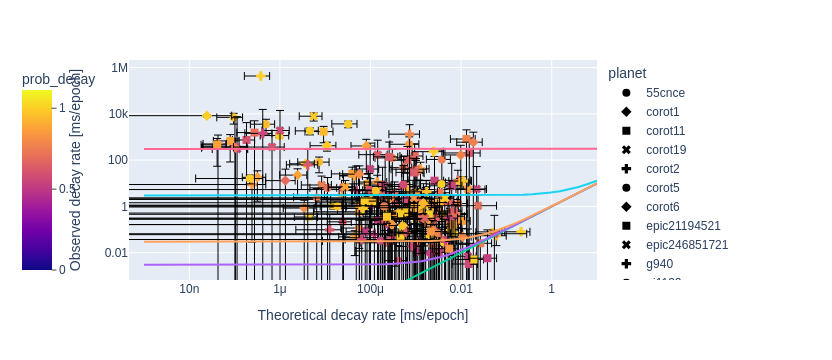

In [260]:
fig = px.scatter(df, x="theoretical_dP_dE_ms", y="observed_dP_dE_ms", symbol="planet", log_x=True, log_y=True,
                 error_x="error_theoretical_dP_dE_ms",
                 error_y="error_observed_dP_dE_ms",
                 color="prob_decay",
                 labels={"theoretical_dP_dE_ms": "Theoretical decay rate [ms/epoch]", "observed_dP_dE_ms": "Observed decay rate [ms/epoch]"},
                 height=1000)

fig.update_traces(marker={'size': 8})
fig.update_traces(error_x={'thickness': 1})
fig.update_traces(error_y={'thickness': 1})

x = [0, 10]
fig.add_traces(go.Scatter(x=x, y=x, mode='lines', name="Theory = Observation"))

example_errors = [0.001, 0.01, 1.0, 100.0]
x = np.logspace(-9, 1)
for error in example_errors:
    bounds = x + (error * 3)
    fig.add_traces(go.Scatter(x=x, y=bounds, mode='lines', name=f"{error} ms/epoch 3σ error bound"))

fig.update_layout(coloraxis_colorbar=dict(yanchor="top", y=1, x=-0.25, ticks="outside"))
fig.show()

The uncertainty lines show us that if the uncertainty in decay rate is large, then the observed decays could well be within 3 sigma of the theoretical decay and it can be hard to distinguish correct from incorrect theory.

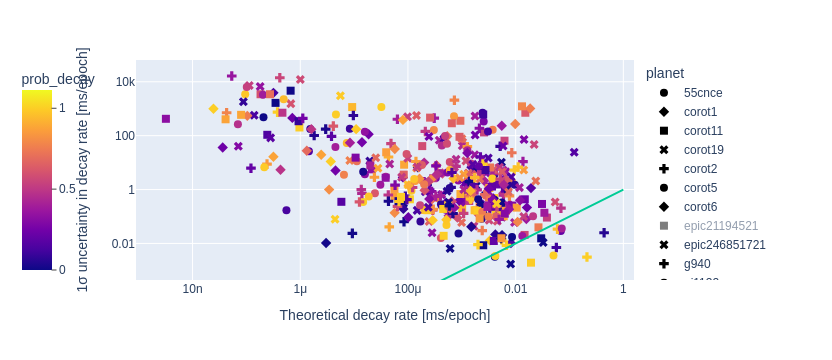

In [71]:
fig = px.scatter(df, x="theoretical_dP_dE_ms", y="error_observed_dP_dE_ms", color="prob_decay", symbol="planet", log_x=True, log_y=True, 
                 labels={"theoretical_dP_dE_ms": "Theoretical decay rate [ms/epoch]", "error_observed_dP_dE_ms": "1σ uncertainty in decay rate [ms/epoch]"},
                 height=1000)
fig.update_traces(marker={'size': 8})

x = [0, 1]
fig.add_traces(go.Scatter(x=x, y=x, mode='lines', name="Theory = 1σ error bound"))

fig.update_layout(coloraxis_colorbar=dict(yanchor="top", y=1, x=-0.25, ticks="outside"))
fig.show()

#### How does observed decay rate vary planetary and stellar parameters?

In [205]:
num_stars = "Number of Stars"
num_planets = "Number of Planets"

semi_major_axis =  "Orbit Semi-Major Axis [au]"
planet_radius =  "Planet Radius [Jupiter Radius]"
planet_mass = 'Planet Mass or Mass*sin(i) [Jupiter Mass]'
planet_density =  "Planet Density [g/cm**3]"
eccentricity = "Eccentricity"

spectral_type = 'Spectral Type'
stellar_eff_temperature = 'Stellar Effective Temperature [K]'
stellar_radius = 'Stellar Radius [Solar Radius]'
stellar_mass = 'Stellar Mass [Solar mass]'
stellar_metallicity = 'Stellar Metallicity [dex]'
stellar_metallicity_ratio = 'Stellar Metallicity Ratio'
stellar_age = 'Stellar Age [Gyr]'
stellar_density = 'Stellar Density [g/cm**3]'


ratio_a_stellar_radius = "Ratio of Semi-Major Axis to Stellar Radius"
ratio_planet_to_stellar_radius = 'Ratio of Planet to Stellar Radius'

In [252]:
earth_radius = 6.378e6  # m
earth_mass = 5.972e24  # kg
solar_radius = 6.957e8 # m
solar_mass = 1.989e30  # kg
jupiter_mass = 1.898e27 # kg

In [253]:
e = 0.01
Rs = solar_radius # stellar radius
Rp = 3 * earth_radius
Ms = 1.5 * solar_mass
Mp = 20 * earth_mass
a = 0.05 * sp.constants.au # semi major axis
P = 1
Qs = 10 ** 5.5 # np.logspace(4, 9)

In [249]:
def plot_relationship(variable, log=False):
    fig = px.scatter(df, x=variable, y="observed_dP_dE_ms", symbol="planet", log_x=log, log_y=True,
                 error_y="error_observed_dP_dE_ms",
                 labels={"observed_dP_dE_ms": "Observed decay rate [ms/epoch]"},
                 height=1000)
    
    x = np.linspace(df[variable].min(), df[variable].max())
    stellar_tide_da_dt = \
        (9/2 * ((sp.constants.G / Ms) ** 0.5) * ((Rs ** 5 * Mp) / Qs) * (1 + (57/4 * e ** 2))) * ((x*sp.constants.au) ** -5.5)
    dP_dt = 3 * sp.constants.pi * np.sqrt((x*sp.constants.au) / (sp.constants.G * Ms)) * stellar_tide_da_dt * 365 * 24 * 60 * 60 * 1000
    dP_dE = dP_dt * (P / 365)
    fig.add_traces(go.Scatter(x=x, y=dP_dE, mode='lines', name="Theory"))

    fig.update_traces(marker={'size': 8})
    fig.update_traces(error_x={'thickness': 0.5})
    fig.update_traces(error_y={'thickness': 0.5})
    fig.show()

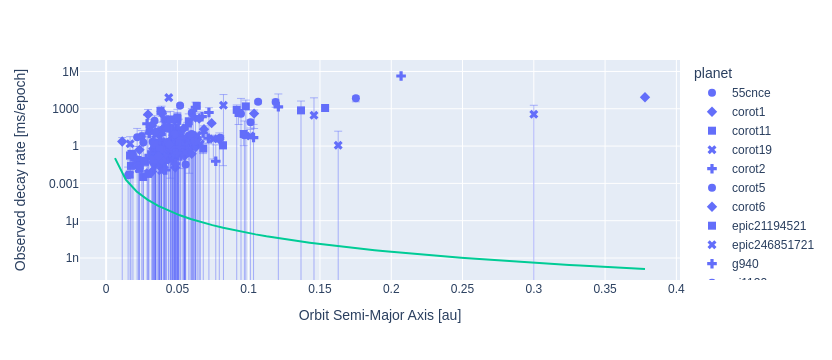

In [250]:
plot_relationship(semi_major_axis)

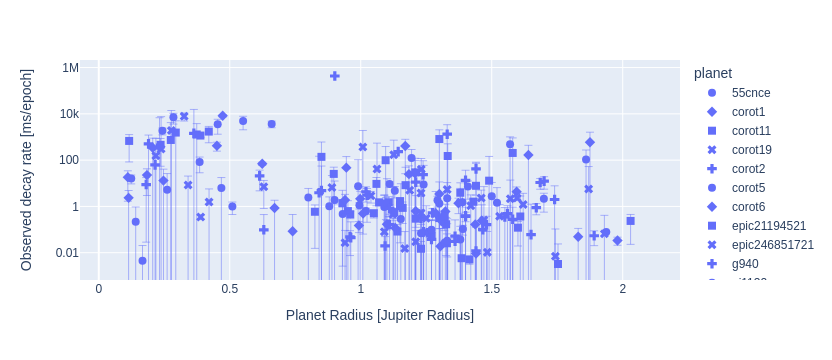

In [135]:
plot_relationship(planet_radius)

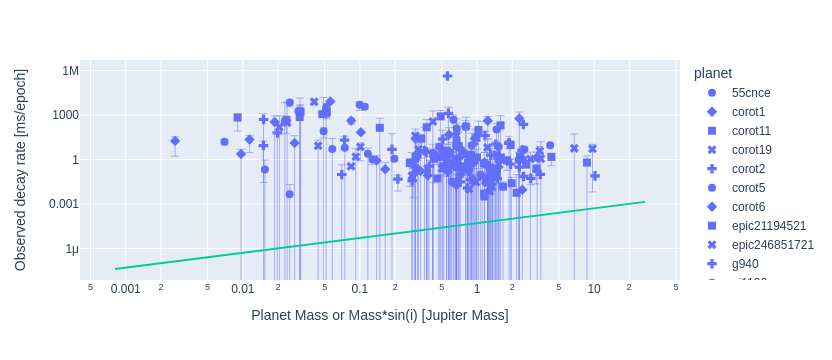

In [254]:
def plot_relationship(variable, log=False):
    fig = px.scatter(df, x=variable, y="observed_dP_dE_ms", symbol="planet", log_x=log, log_y=True,
                 error_y="error_observed_dP_dE_ms",
                 labels={"observed_dP_dE_ms": "Observed decay rate [ms/epoch]"},
                 height=1000)
    
    x = np.linspace(df[variable].min(), df[variable].max())
    stellar_tide_da_dt = \
        (9/2 * ((sp.constants.G / Ms) ** 0.5) * ((Rs ** 5 * x * jupiter_mass) / Qs) * (1 + (57/4 * e ** 2))) * (a ** -5.5)
    dP_dt = 3 * sp.constants.pi * np.sqrt(a / (sp.constants.G * Ms)) * stellar_tide_da_dt * 365 * 24 * 60 * 60 * 1000
    dP_dE = dP_dt * (P / 365)
    fig.add_traces(go.Scatter(x=x, y=dP_dE, mode='lines', name="Theory"))

    fig.update_traces(marker={'size': 8})
    fig.update_traces(error_x={'thickness': 0.5})
    fig.update_traces(error_y={'thickness': 0.5})
    fig.show()

plot_relationship(planet_mass, log=True)

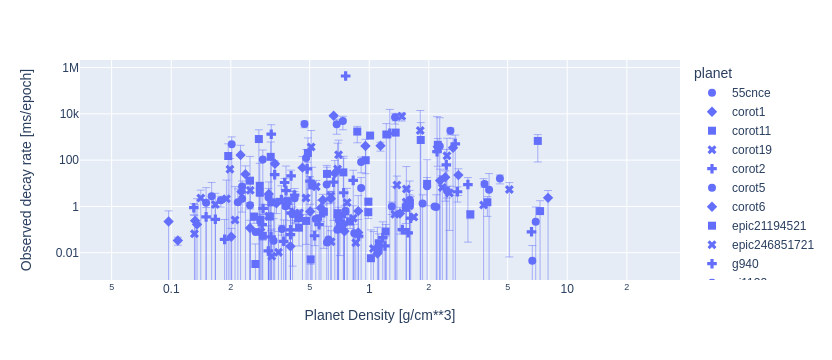

In [137]:
plot_relationship(planet_density, log=True)

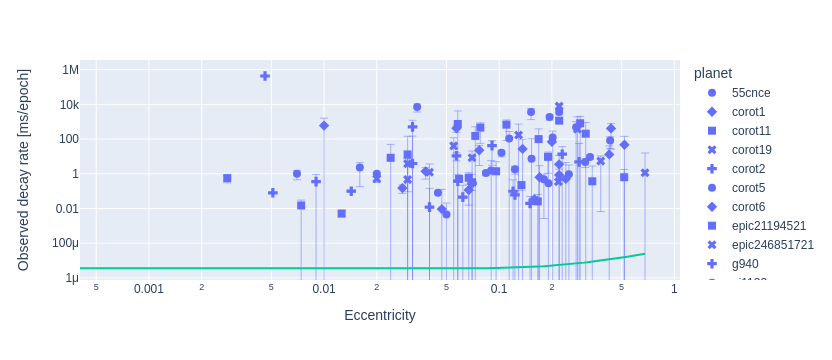

In [257]:
def plot_relationship(variable, log=False):
    fig = px.scatter(df, x=variable, y="observed_dP_dE_ms", symbol="planet", log_x=log, log_y=True,
                 error_y="error_observed_dP_dE_ms",
                 labels={"observed_dP_dE_ms": "Observed decay rate [ms/epoch]"},
                 height=1000)
    
    x = np.linspace(df[variable].min(), df[variable].max())
    e = x
    stellar_tide_da_dt = \
        (9/2 * ((sp.constants.G / Ms) ** 0.5) * ((Rs ** 5 * Mp) / Qs) * (1 + (57/4 * e ** 2))) * (a ** -5.5)
    dP_dt = 3 * sp.constants.pi * np.sqrt(a / (sp.constants.G * Ms)) * stellar_tide_da_dt * 365 * 24 * 60 * 60 * 1000
    dP_dE = dP_dt * (P / 365)
    fig.add_traces(go.Scatter(x=x, y=dP_dE, mode='lines', name="Theory"))

    fig.update_traces(marker={'size': 8})
    fig.update_traces(error_x={'thickness': 0.5})
    fig.update_traces(error_y={'thickness': 0.5})
    fig.show()

plot_relationship(eccentricity, log=True)

Now investigating stellar parameters:

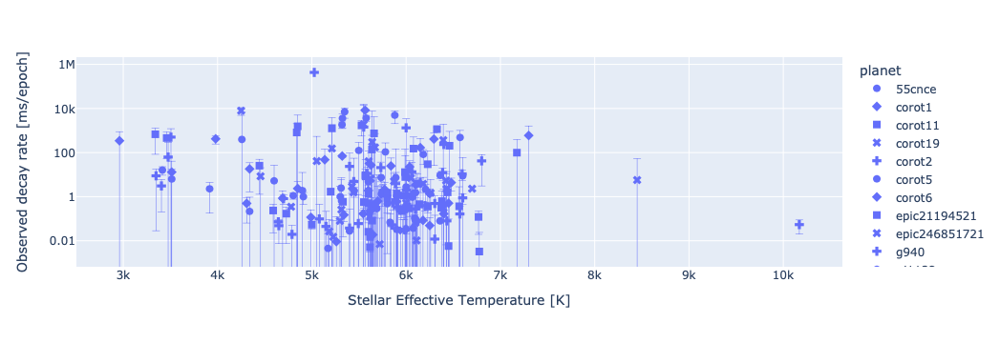

In [139]:
plot_relationship(stellar_eff_temperature)

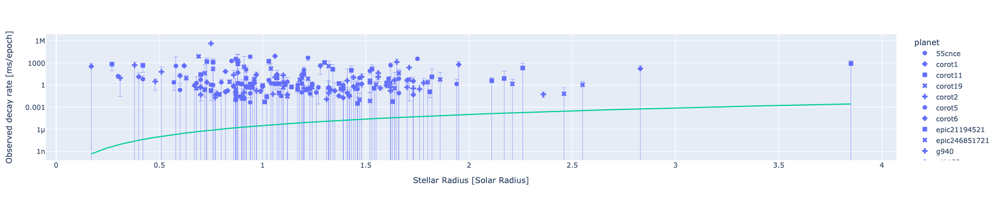

In [259]:
def plot_relationship(variable, log=False):
    fig = px.scatter(df, x=variable, y="observed_dP_dE_ms", symbol="planet", log_x=log, log_y=True,
                 error_y="error_observed_dP_dE_ms",
                 labels={"observed_dP_dE_ms": "Observed decay rate [ms/epoch]"},
                 height=1000)
    
    x = np.linspace(df[variable].min(), df[variable].max())
    Rs = x * solar_radius
    stellar_tide_da_dt = \
        (9/2 * ((sp.constants.G / Ms) ** 0.5) * ((Rs ** 5 * Mp) / Qs) * (1 + (57/4 * e ** 2))) * (a ** -5.5)
    dP_dt = 3 * sp.constants.pi * np.sqrt(a / (sp.constants.G * Ms)) * stellar_tide_da_dt * 365 * 24 * 60 * 60 * 1000
    dP_dE = dP_dt * (P / 365)
    fig.add_traces(go.Scatter(x=x, y=dP_dE, mode='lines', name="Theory"))

    fig.update_traces(marker={'size': 8})
    fig.update_traces(error_x={'thickness': 0.5})
    fig.update_traces(error_y={'thickness': 0.5})
    fig.show()

plot_relationship(stellar_radius)

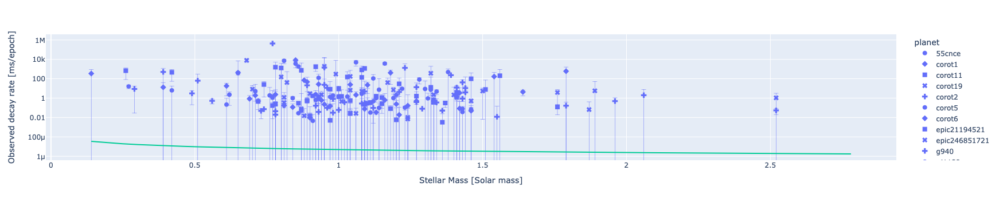

In [258]:
def plot_relationship(variable, log=False):
    fig = px.scatter(df, x=variable, y="observed_dP_dE_ms", symbol="planet", log_x=log, log_y=True,
                 error_y="error_observed_dP_dE_ms",
                 labels={"observed_dP_dE_ms": "Observed decay rate [ms/epoch]"},
                 height=1000)
    
    x = np.linspace(df[variable].min(), df[variable].max())
    Ms = x * solar_mass
    stellar_tide_da_dt = \
        (9/2 * ((sp.constants.G / Ms) ** 0.5) * ((Rs ** 5 * Mp) / Qs) * (1 + (57/4 * e ** 2))) * (a ** -5.5)
    dP_dt = 3 * sp.constants.pi * np.sqrt(a / (sp.constants.G * Ms)) * stellar_tide_da_dt * 365 * 24 * 60 * 60 * 1000
    dP_dE = dP_dt * (P / 365)
    fig.add_traces(go.Scatter(x=x, y=dP_dE, mode='lines', name="Theory"))

    fig.update_traces(marker={'size': 8})
    fig.update_traces(error_x={'thickness': 0.5})
    fig.update_traces(error_y={'thickness': 0.5})
    fig.show()

plot_relationship(stellar_mass)

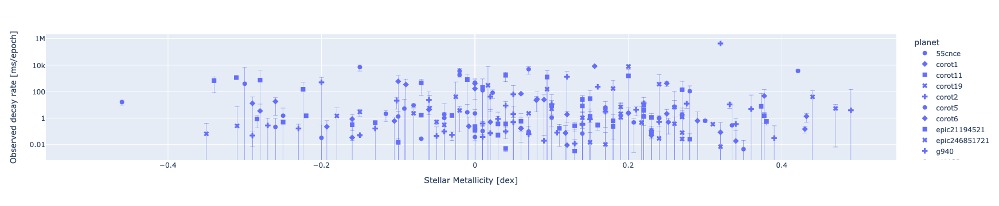

In [142]:
plot_relationship(stellar_metallicity)

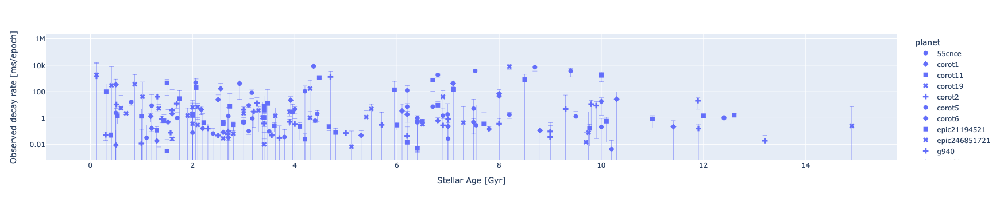

In [143]:
plot_relationship(stellar_age)

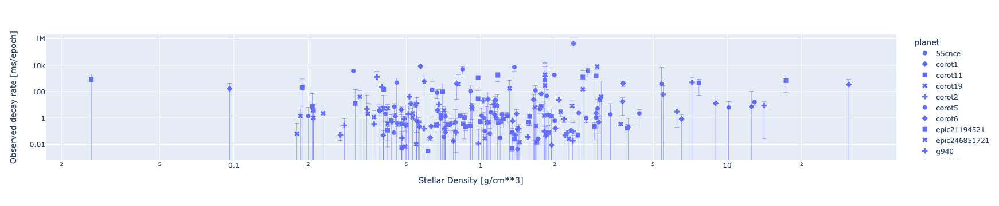

In [144]:
plot_relationship(stellar_density, log=True)

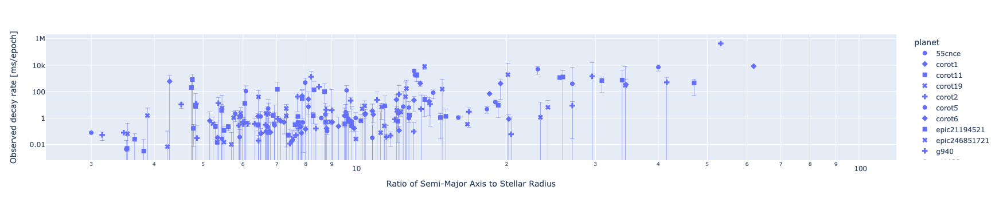

In [145]:
plot_relationship(ratio_a_stellar_radius, log=True)

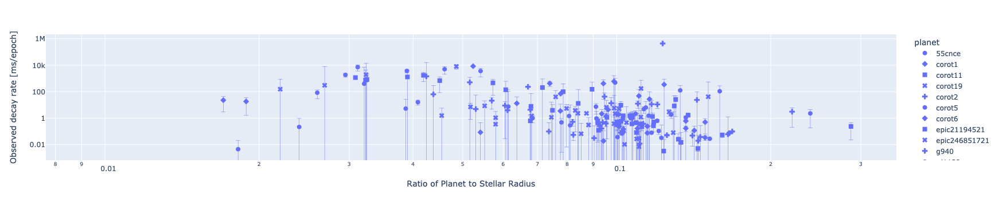

In [146]:
plot_relationship(ratio_planet_to_stellar_radius, log=True)

We need to:
* reduce uncertainty in the observed decay rates
* construct more sophisticated models to identify which of these are "causal" factors and which are simply correlations